<font size=7> Create Footprints

# Setup

In [1]:
from human_hip import spike_data
import numpy as np
from human_hip.spike_data import *
import pickle

import matplotlib.pyplot as plt
import matplotlib.cm as cm
from ipywidgets import interact_manual, interact

In [2]:
import matplotlib.pyplot as plt
import random

def plot_footprint( sd, neuron_ids):
    
    # Scatter plot of neurons
    plt.figure(figsize=(8, 8))
    neuron_x = []
    neuron_y = []
    for neuron in sd.neuron_data[0].values():
        neuron_x.append(neuron['position'][0])
        neuron_y.append(neuron['position'][1])
    plt.scatter(neuron_x, neuron_y, alpha=0.10, c='grey')
  
    # Plot neuron geographic location
    if type(neuron_ids) == int:
        neuron_ids = [neuron_ids]
    for neuron_id in neuron_ids:
        for neighbor in  sd.neuron_data[0][neuron_id]['neighbor_positions']:
            plt.scatter( [neighbor[0]+random.random()*13], [neighbor[1]+random.random()*10], alpha=0.40, c='blue')

    plt.xlabel('um')
    plt.ylabel('um')
    plt.title("Directionality plot")
    plt.show()


In [3]:
def plot_waveform_layout( neuron_id, sd, axs=None, ylim_margin=0):
    if axs is None:
        fig, axs = plt.subplots(1, 1, figsize=(8,8) )
    #axs.set_title(title, fontsize=12)

    
    #setting parameters that were previously function variables in Sury's code
    data = sd.neuron_data[0][id]
    ch=data["channel"]
    position=data["position"]
    temp_chs=list(data["neighbor_channels"])
    temp_pos=data["neighbor_positions"]; templates=data["neighbor_templates"]; filename=f"{id}"; nelec=2
    
    #axs.set_title(f"{filename} cluster {k} channel {ch} {position}")
    assert len(temp_chs) == len(temp_pos) == len(templates), "Input length should be the same!"
    nums = len(temp_chs)
    pitch = 17.5

    # set same scaling to the insets
    index = temp_chs.index(ch)
    ylim_min = min(templates[index])
    ylim_max = max(templates[index])
    # choose channels that are close to the center channel
    for i in range(nums):
        chn_pos = temp_pos[i]
        if position[0] - nelec * pitch <= chn_pos[0] <= position[0] + nelec * pitch \
                and position[1] - nelec * pitch <= chn_pos[1] <= position[1] + nelec * pitch:
            # axs.scatter(chn_pos[0], chn_pos[1], color='w')
            axin = axs.inset_axes([chn_pos[0]-5, chn_pos[1]-5, 15, 20], transform=axs.transData)
            axin.plot(templates[i], color='k', linewidth=2, alpha=0.7)
            axin.set_ylim([ylim_min - ylim_margin, ylim_max + ylim_margin])
            axin.set_axis_off()

    axs.set_xlim(position[0]-1.5*nelec*pitch, position[0]+1.5*nelec*pitch)
    axs.set_ylim(position[1]-1.5*nelec*pitch, position[1]+1.5*nelec*pitch)
    axs.invert_yaxis()
    return axs

In [4]:
sd = read_autocurated_data( "/workspaces/human_hippocampus/data/ephys/2023-12-03-e-Hc112823_avv9hckcr1/derived/kilosort2/Hc112823_avv9hckcr1_21841_120323_3_acqm.zip" )


In [5]:
# def plot_waveform_layout( neuron_id, sd, axs=None, ylim_margin=0):
#     if axs is None:
#         fig, axs = plt.subplots(1, 1, figsize=(8,8) )
#     #axs.set_title(title, fontsize=12)

#     #setting parameters that were previously function variables in Sury's code
#     data = sd.neuron_data[0][neuron_id]
#     k=neuron_id
#     ch=data["channel"]
#     position=data["position"]
#     temp_chs=list(data["neighbor_channels"])
#     temp_pos=data["neighbor_positions"]; templates=data["neighbor_templates"]; filename=f"{id}"; nelec=2
    
#     axs.set_title(f"{filename} cluster {k} channel {ch} {position}")
#     assert len(temp_chs) == len(temp_pos) == len(templates), "Input length should be the same!"
#     nums = len(temp_chs)
#     pitch = 17.5
#     axs.scatter(position[0], position[1], linewidth=10, alpha=0.2, color='grey')
#     axs.text(position[0], position[1], str(position), color="g", fontsize=12)
#     # set same scaling to the insets
#     index = temp_chs.index(ch)
#     ylim_min = min(templates[index])
#     ylim_max = max(templates[index])
#     # choose channels that are close to the center channel
#     for i in range(nums):
#         chn_pos = temp_pos[i]
#         if position[0] - nelec * pitch <= chn_pos[0] <= position[0] + nelec * pitch \
#                 and position[1] - nelec * pitch <= chn_pos[1] <= position[1] + nelec * pitch:
#             # axs.scatter(chn_pos[0], chn_pos[1], color='w')
#             axin = axs.inset_axes([chn_pos[0]-5, chn_pos[1]-5, 15, 20], transform=axs.transData)
#             axin.plot(templates[i], color='k', linewidth=2, alpha=0.7)
#             axin.set_ylim([ylim_min - ylim_margin, ylim_max + ylim_margin])
#             axin.set_axis_off()
#     # axs.legend(loc="upper right", fontsize=12)
#     # axs.xaxis.set_visible(False)
#     # axs.yaxis.set_visible(False)
#     axs.set_xlim(position[0]-1.5*nelec*pitch, position[0]+1.5*nelec*pitch)
#     axs.set_ylim(position[1]-1.5*nelec*pitch, position[1]+1.5*nelec*pitch)
#     axs.invert_yaxis()
#     return axs

# HC112823

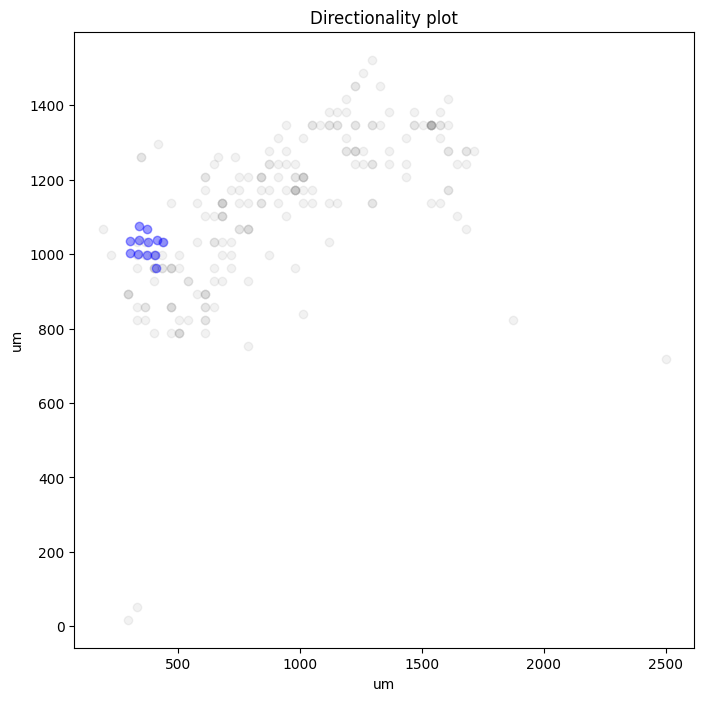

In [10]:
plot_footprint(sd,0)

/tmp/ipykernel_1671/392145278.py:8: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  data = sd.neuron_data[0][id]


<Axes: >

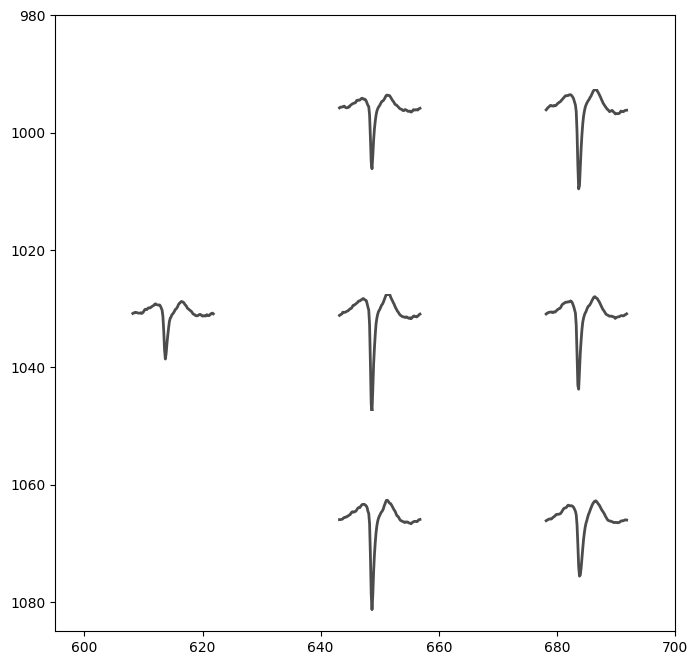

In [19]:
plot_waveform_layout([100], sd)

# <font color="brown" > Break Down Function

/tmp/ipykernel_615/3134716770.py:5: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  data = sd.neuron_data[0][50]


NameError: name 'temp_chs' is not defined

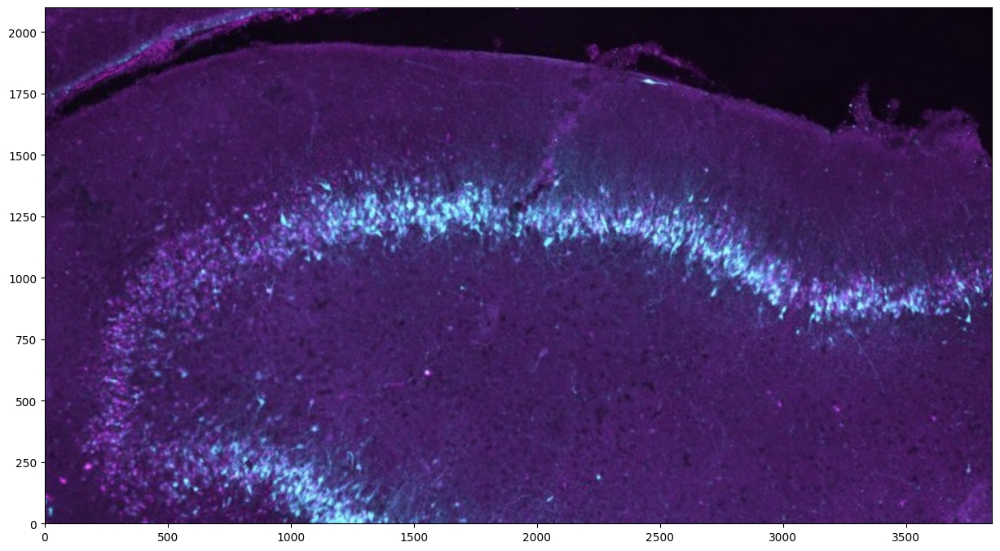

In [6]:
plt.figure(figsize=(15,10)) 
img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823.png")      # Load in image
plt.imshow(img,  extent=[0, 3850, 0, 2100]) # Plot image, have it correspond to electrode dimensions

data = sd.neuron_data[0][50]
xy =data["neighbor_positions"]
templates=data["neighbor_templates"]
for i in range(len(temp_chs)):
    plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]/1 +xy[i,1], color="magenta"  )

data = sd.neuron_data[0][100]
xy =data["neighbor_positions"]
templates=data["neighbor_templates"]
for i in range(len(temp_chs)):
    plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*5 +xy[i,1], color="lime"  )

data = sd.neuron_data[0][150]
xy =data["neighbor_positions"]
templates=data["neighbor_templates"]
for i in range(len(temp_chs)):
    plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*5 +xy[i,1], color="orange"  )

plt.xlim( 0, 1750 )                                       # Set axis limits to that of the MEA
plt.ylim( 0, 1750 )
plt.xlabel('um')                                         # add axises and title
plt.ylabel('um')
plt.title(f"Neuron & Electrode Layout")

/tmp/ipykernel_615/3434982587.py:6: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  data = sd.neuron_data[0][num]


NameError: name 'temp_chs' is not defined

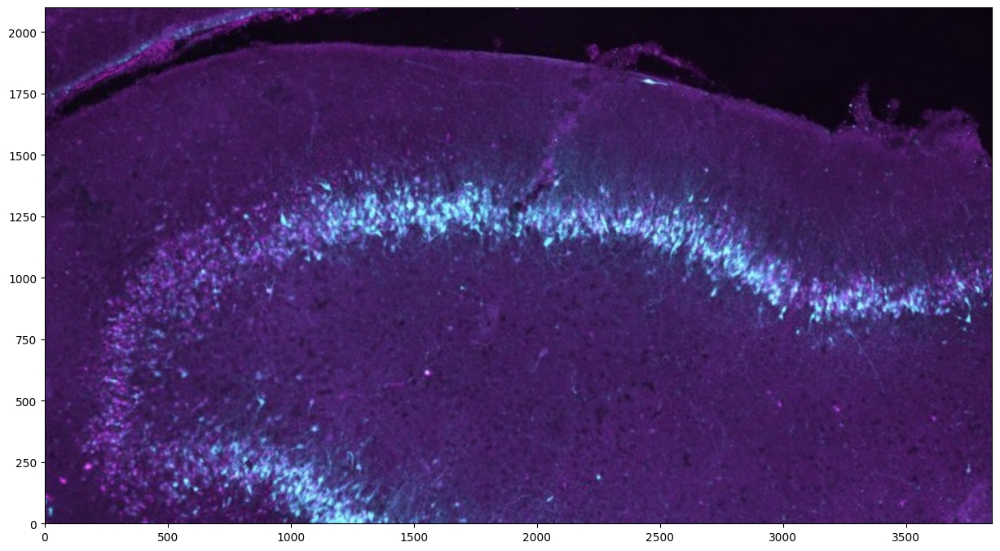

In [7]:
plt.figure(figsize=(15,10)) 
img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823.png")      # Load in image
plt.imshow(img,  extent=[0, 3850, 0, 2100]) # Plot image, have it correspond to electrode dimensions

for num in [5,16,29, 33,36,37,38, 44, 47, 58, 93, 94, 98]:
    data = sd.neuron_data[0][num]
    xy =data["neighbor_positions"]
    templates=data["neighbor_templates"]
    for i in range(len(temp_chs)):
        plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*5 +xy[i,1], color="lime"  )

plt.xlim( 600, 1400 )                                       # Set axis limits to that of the MEA
plt.ylim( 800, 1500 )
plt.xlabel('um')                                         # add axises and title
plt.ylabel('um')
plt.title(f"Neuron & Electrode Layout") 

In [ ]:
good_neurons = [5,16,29, 33,36,37,38, 44, 47, 58, 93, 94, 98]

/tmp/ipykernel_1671/3457461198.py:6: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  data = sd.neuron_data[0][num]


Text(0.5, 1.0, 'Neuron & Electrode Layout')

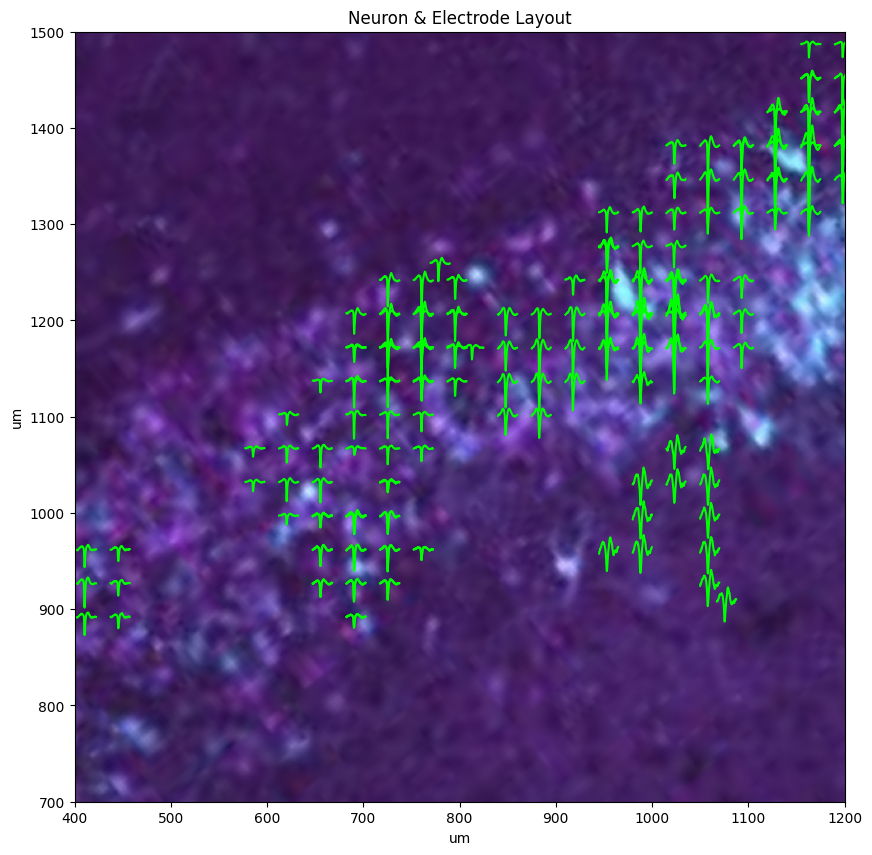

In [91]:
plt.figure(figsize=(15,10)) 
img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823.png")      # Load in image
plt.imshow(img,  extent=[0, 3850, 0, 2100]) # Plot image, have it correspond to electrode dimensions

for num in [4,16, 3,5,16,29, 33,36,37,38, 44, 47, 58, 93, 94, 98]:
    data = sd.neuron_data[0][num]
    xy =data["neighbor_positions"]
    templates=data["neighbor_templates"]
    for i in range(len(temp_chs)):
        plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*5 +xy[i,1], color="lime"  )

plt.xlim( 400, 1200 )                                       # Set axis limits to that of the MEA
plt.ylim( 700, 1500 )
plt.xlabel('um')                                         # add axises and title
plt.ylabel('um')
plt.title(f"Neuron & Electrode Layout") 

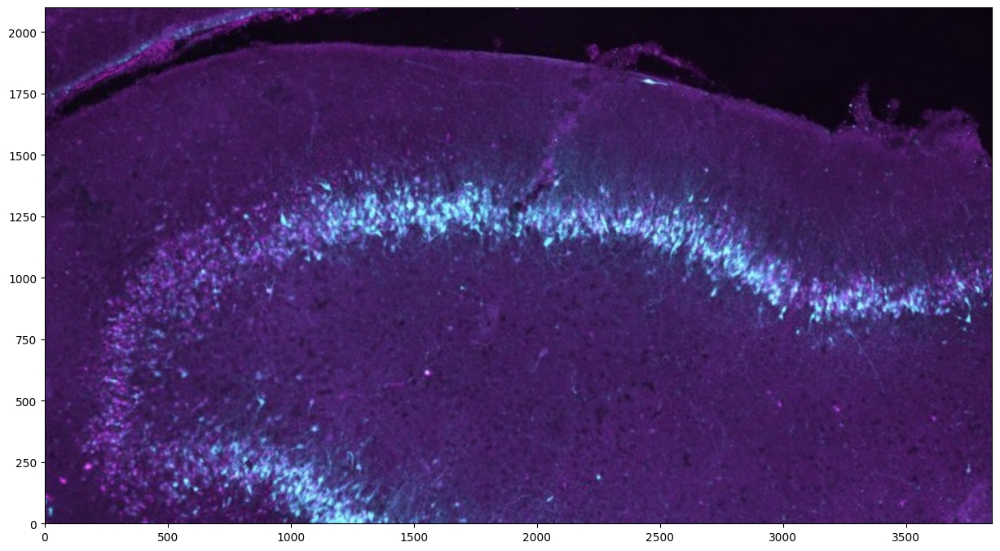

interactive(children=(Dropdown(description='num', options=(4, 16, 3, 5, 16, 29, 33, 36, 37, 38, 44, 47, 58, 93…

In [8]:
@interact( num=[4,16, 3,5,16,29, 33,36,37,38, 44, 47, 58, 93, 94, 98] )
def draw_neuron(num):
    plt.figure(figsize=(15,10)) 
    img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823.png")      # Load in image
    plt.imshow(img,  extent=[0, 3850, 0, 2100]) # Plot image, have it correspond to electrode dimensions

    data = sd.neuron_data[0][num]
    xy =data["neighbor_positions"]
    templates=data["neighbor_templates"]
    for i in range(len(temp_chs)):
        plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*5 +xy[i,1], color="lime"  )

    plt.xlim( 0, 1750 )                                       # Set axis limits to that of the MEA
    plt.ylim( 0, 1750 )
    plt.xlabel('um')                                         # add axises and title
    plt.ylabel('um')
    plt.title(f"Neuron & Electrode Layout") 

In [50]:
@interact( num=(0,sd.N) )
def draw_neuron(num):
    plt.figure(figsize=(15,10)) 
    img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823.png")      # Load in image
    plt.imshow(img,  extent=[0, 3850, 0, 2100]) # Plot image, have it correspond to electrode dimensions

    data = sd.neuron_data[0][num]
    temp_chs=list(data["neighbor_channels"])
    xy =data["neighbor_positions"]
    templates=data["neighbor_templates"]
    for i in range(len(temp_chs)):
        plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*5 +xy[i,1], color="lime"  )

    data = sd.neuron_data[0][27]
    temp_chs=list(data["neighbor_channels"])
    xy =data["neighbor_positions"]
    templates=data["neighbor_templates"]
    for i in range(len(temp_chs)):
        plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*2.5 +xy[i,1], linewidth=3, color="blue"  )


    data = sd.neuron_data[0][121]
    temp_chs=list(data["neighbor_channels"])
    xy =data["neighbor_positions"]
    templates=data["neighbor_templates"]
    for i in range(len(temp_chs)):
        plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*5 +xy[i,1], linewidth=3, color="lime"  )


    data = sd.neuron_data[0][118]
    temp_chs=list(data["neighbor_channels"])
    xy =data["neighbor_positions"]
    templates=data["neighbor_templates"]
    for i in range(len(temp_chs)):
        plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*3 +xy[i,1], linewidth=3, color="red"  )


    plt.xlim( 0, 1750 )                                       # Set axis limits to that of the MEA
    plt.ylim( 0, 1750 )
    plt.xlabel('um')                                         # add axises and title
    plt.ylabel('um')
    plt.title(f"Neuron & Electrode Layout") 

interactive(children=(IntSlider(value=106, description='num', max=212), Output()), _dom_classes=('widget-inter…

# <font color="brown"> Try 1

/tmp/ipykernel_615/4013592201.py:5: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  data = sd.neuron_data[0][36]
/tmp/ipykernel_615/4013592201.py:11: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  data = sd.neuron_data[0][100]
/tmp/ipykernel_615/4013592201.py:17: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  data = sd.neuron_data[0][98]
/tmp/ipykernel_615/4013592201.py:23: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  data = sd.neuron_data[0][150]


Text(0.5, 1.0, 'Neuron & Electrode Layout')

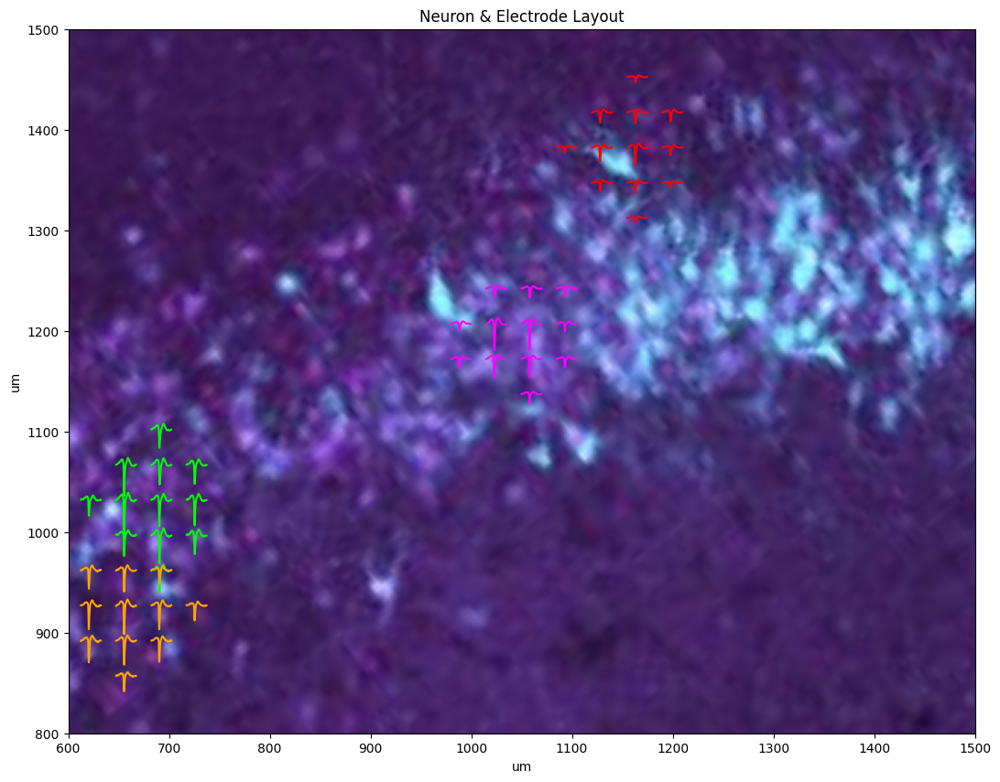

In [12]:
plt.figure(figsize=(15,10)) 
img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823.png")      # Load in image
plt.imshow(img,  extent=[0, 3850, 0, 2100]) # Plot image, have it correspond to electrode dimensions

data = sd.neuron_data[0][36]
xy =data["neighbor_positions"]
templates=data["neighbor_templates"]
for i in range(len(temp_chs)):
    plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]/1 +xy[i,1], color="red"  )

data = sd.neuron_data[0][100]
xy =data["neighbor_positions"]
templates=data["neighbor_templates"]
for i in range(len(temp_chs)):
    plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*5 +xy[i,1], color="lime"  )

data = sd.neuron_data[0][98]
xy =data["neighbor_positions"]
templates=data["neighbor_templates"]
for i in range(len(temp_chs)):
    plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*2 +xy[i,1], color="magenta"  )

data = sd.neuron_data[0][150]
xy =data["neighbor_positions"]
templates=data["neighbor_templates"]
for i in range(len(temp_chs)):
    plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*5 +xy[i,1], color="orange"  )

plt.xlim( 400, 1300 )                                       # Set axis limits to that of the MEA
plt.ylim( 800, 1500 )
plt.xlabel('um')                                         # add axises and title
plt.ylabel('um')
plt.title(f"Neuron & Electrode Layout")

# <font color="brown"> Try 2

/tmp/ipykernel_615/1496007381.py:6: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  data = sd.neuron_data[0][5]
/tmp/ipykernel_615/1496007381.py:13: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  data = sd.neuron_data[0][38]
/tmp/ipykernel_615/1496007381.py:21: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  data = sd.neuron_data[0][16]


Text(0.5, 1.0, 'Neuron & Electrode Layout')

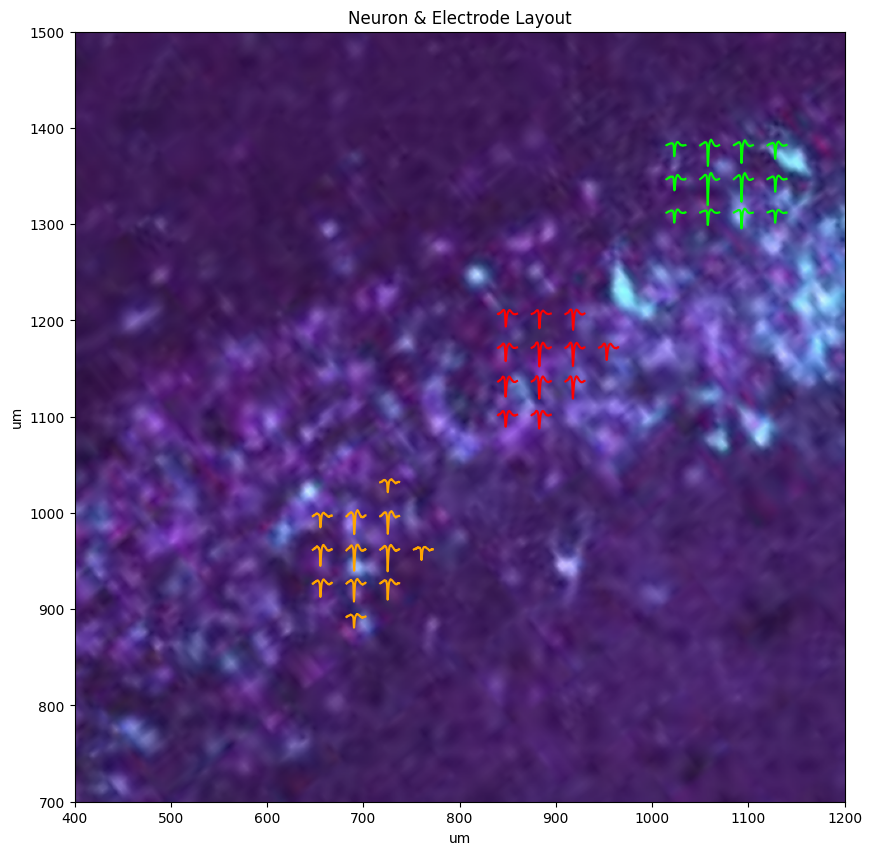

In [10]:
plt.figure(figsize=(15,10)) 
img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823.png")      # Load in image
plt.imshow(img,  extent=[0, 3850, 0, 2100]) # Plot image, have it correspond to electrode dimensions

#for num in [4,16, 3,5,16,29, 33,36,37,38, 44, 47, 58, 93, 94, 98]:
# data = sd.neuron_data[0][5]
# temp_chs=list(data["neighbor_channels"])
# xy =data["neighbor_positions"]
# templates=data["neighbor_templates"]
# for i in range(len(temp_chs)):
#     plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*3 +xy[i,1], color="lime"  )
    
# data = sd.neuron_data[0][38]
# temp_chs=list(data["neighbor_channels"])
# xy =data["neighbor_positions"]
# templates=data["neighbor_templates"]
# for i in range(len(temp_chs)):
#     plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*3 +xy[i,1], color="red"  )


# data = sd.neuron_data[0][16]
# temp_chs=list(data["neighbor_channels"])
# xy =data["neighbor_positions"]
# templates=data["neighbor_templates"]
# for i in range(len(temp_chs)):
#     plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*5 +xy[i,1], color="orange"  )


plt.xlim( 400, 1200 )                                       # Set axis limits to that of the MEA
plt.ylim( 700, 1500 )
plt.xlabel('um')                                         # add axises and title
plt.ylabel('um')
plt.title(f"Neuron & Electrode Layout") 

# <font color="brown"> Try 3

/tmp/ipykernel_615/403832437.py:6: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  data = sd.neuron_data[0][109]
/tmp/ipykernel_615/403832437.py:13: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  data = sd.neuron_data[0][116]
/tmp/ipykernel_615/403832437.py:21: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  data = sd.neuron_data[0][121]


Text(0.5, 1.0, 'Neuron & Electrode Layout')

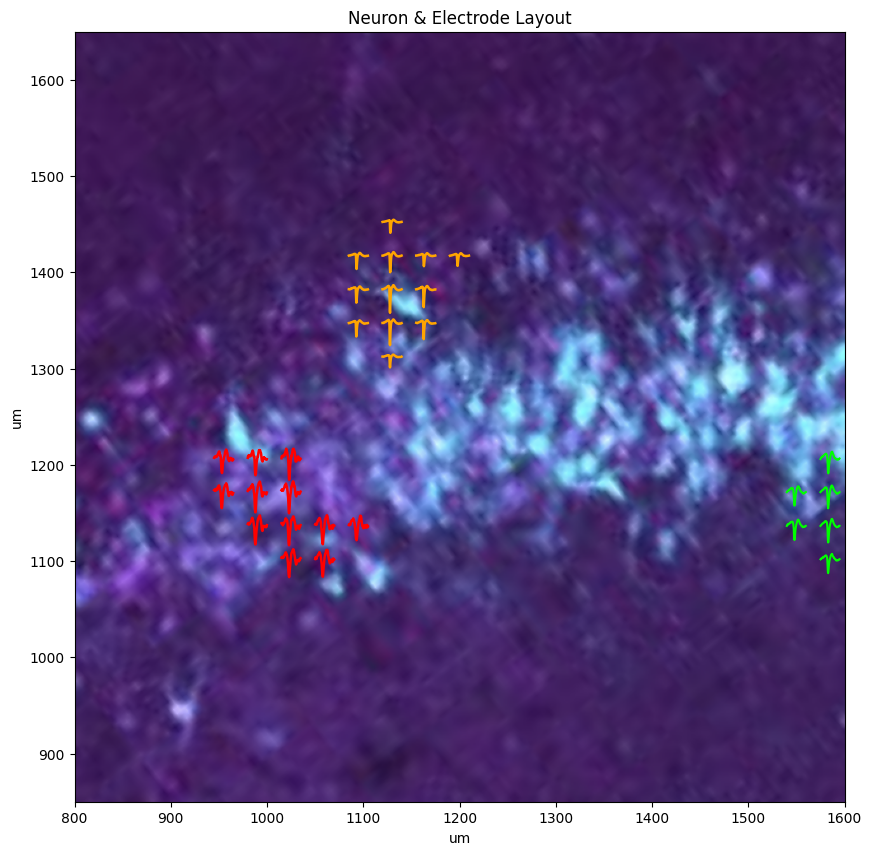

In [24]:
plt.figure(figsize=(15,10)) 
img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823.png")      # Load in image
plt.imshow(img,  extent=[0, 3850, 0, 2100]) # Plot image, have it correspond to electrode dimensions

# #for num in [4,16, 3,5,16,29, 33,36,37,38, 44, 47, 58, 93, 94, 98]:
data = sd.neuron_data[0][109]
temp_chs=list(data["neighbor_channels"])
xy =data["neighbor_positions"]
templates=data["neighbor_templates"]
for i in range(len(temp_chs)):
    plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*1.8 +xy[i,1], linewidth=1.8, color="orange"  )
    
data = sd.neuron_data[0][116]
temp_chs=list(data["neighbor_channels"])
xy =data["neighbor_positions"]
templates=data["neighbor_templates"]
for i in range(len(temp_chs)):
    plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*3 +xy[i,1], linewidth=1.8, color="red"  )


data = sd.neuron_data[0][121]
temp_chs=list(data["neighbor_channels"])
xy =data["neighbor_positions"]
templates=data["neighbor_templates"]
for i in range(len(temp_chs)):
    plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*5 +xy[i,1], color="lime"  )


plt.xlim( 800, 1600 )                                       # Set axis limits to that of the MEA
plt.ylim( 850, 1650 )
plt.xlabel('um')                                         # add axises and title
plt.ylabel('um')
plt.title(f"Neuron & Electrode Layout") 

/tmp/ipykernel_615/1354175834.py:13: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  data = sd.neuron_data[0][116]
/tmp/ipykernel_615/1354175834.py:21: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  data = sd.neuron_data[0][121]
/tmp/ipykernel_615/1354175834.py:29: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  data = sd.neuron_data[0][118]


Text(0.5, 1.0, 'Neuron & Electrode Layout')

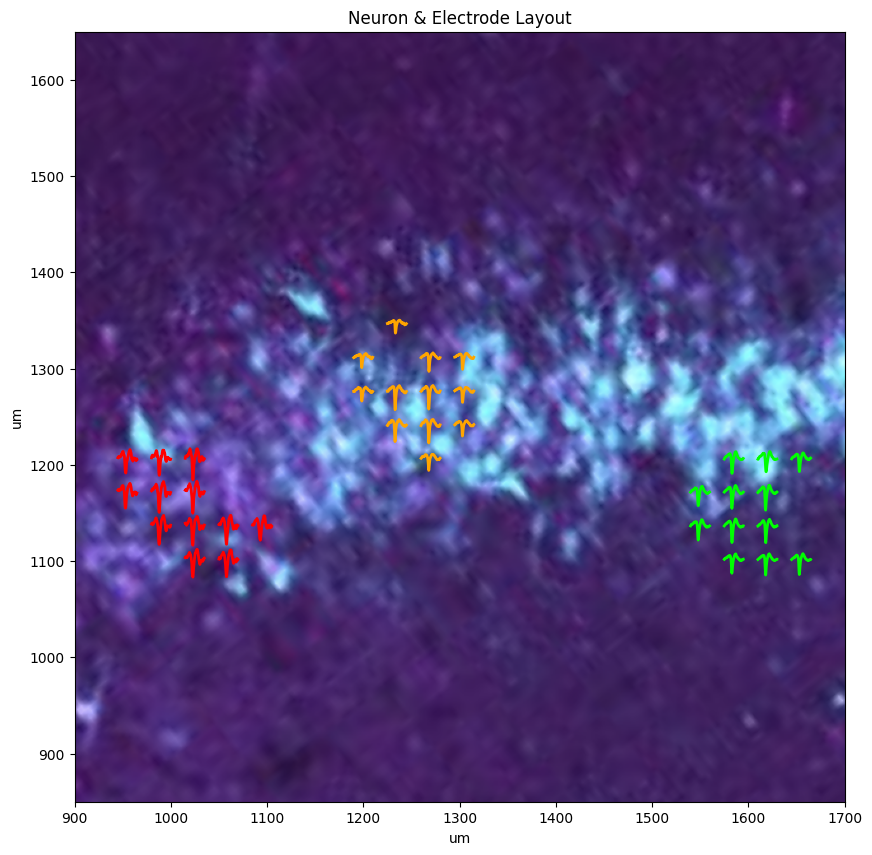

In [28]:
plt.figure(figsize=(15,10)) 
img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823.png")      # Load in image
plt.imshow(img,  extent=[0, 3850, 0, 2100]) # Plot image, have it correspond to electrode dimensions

# #for num in [4,16, 3,5,16,29, 33,36,37,38, 44, 47, 58, 93, 94, 98]:
# data = sd.neuron_data[0][109]
# temp_chs=list(data["neighbor_channels"])
# xy =data["neighbor_positions"]
# templates=data["neighbor_templates"]
# for i in range(len(temp_chs)):
#     plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*1.8 +xy[i,1], linewidth=1.8, color="orange"  )
    
data = sd.neuron_data[0][116]
temp_chs=list(data["neighbor_channels"])
xy =data["neighbor_positions"]
templates=data["neighbor_templates"]
for i in range(len(temp_chs)):
    plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*3 +xy[i,1], linewidth=2, color="red"  )


data = sd.neuron_data[0][121]
temp_chs=list(data["neighbor_channels"])
xy =data["neighbor_positions"]
templates=data["neighbor_templates"]
for i in range(len(temp_chs)):
    plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*5 +xy[i,1], linewidth=2, color="lime"  )


data = sd.neuron_data[0][118]
temp_chs=list(data["neighbor_channels"])
xy =data["neighbor_positions"]
templates=data["neighbor_templates"]
for i in range(len(temp_chs)):
    plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*3 +xy[i,1], linewidth=2, color="orange"  )


plt.xlim( 900, 1700 )                                       # Set axis limits to that of the MEA
plt.ylim( 850, 1650 )
plt.xlabel('um')                                         # add axises and title
plt.ylabel('um')
plt.title(f"Neuron & Electrode Layout") 

# <font color="brown"> Try 4

In [35]:
1700-1100
1650 - 850

800

/tmp/ipykernel_615/2068466504.py:13: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  data = sd.neuron_data[0][27]
/tmp/ipykernel_615/2068466504.py:21: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  data = sd.neuron_data[0][121]
/tmp/ipykernel_615/2068466504.py:29: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  data = sd.neuron_data[0][118]
/tmp/ipykernel_615/2068466504.py:53: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  data = sd.neuron_data[0][193] #158
/tmp/ipykernel_615/2068466504.py:61: DeprecationWarning: Call to depreca

Text(0.5, 1.0, 'Neuron & Electrode Layout')

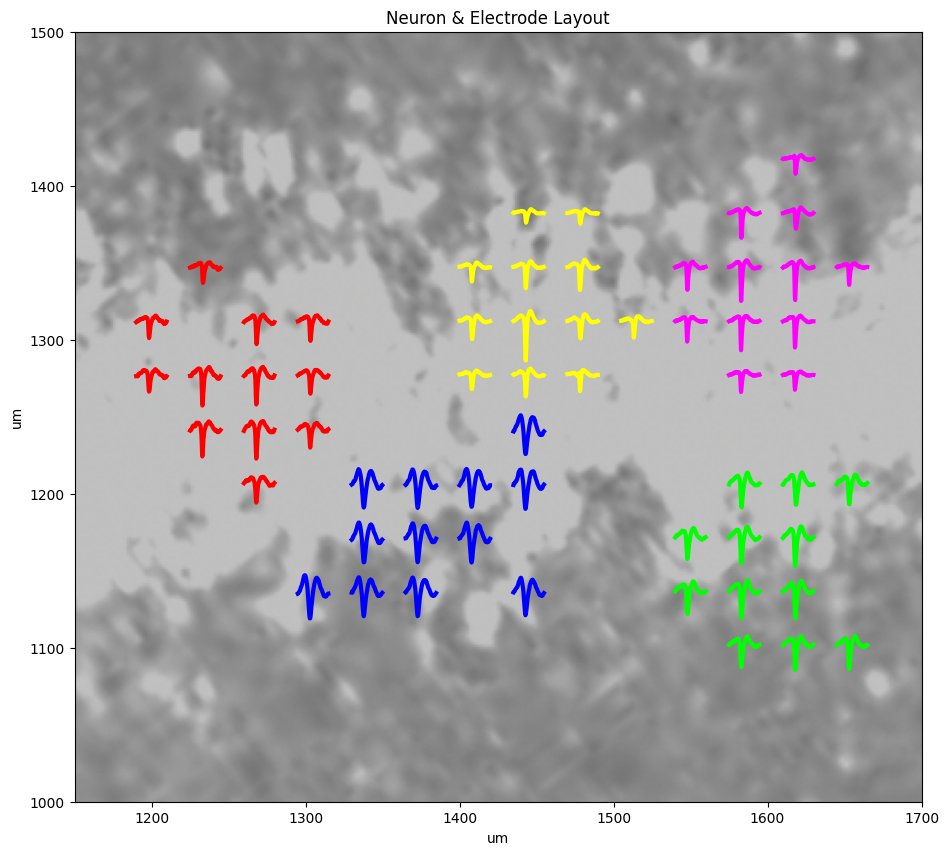

In [66]:
plt.figure(figsize=(15,10)) 
img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823_bw_old.png")      # Load in image
plt.imshow(img,  extent=[0, 3850, 0, 2100]) # Plot image, have it correspond to electrode dimensions

# #for num in [4,16, 3,5,16,29, 33,36,37,38, 44, 47, 58, 93, 94, 98]:
# data = sd.neuron_data[0][109]
# temp_chs=list(data["neighbor_channels"])
# xy =data["neighbor_positions"]
# templates=data["neighbor_templates"]
# for i in range(len(temp_chs)):
#     plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*1.8 +xy[i,1], linewidth=1.8, color="orange"  )
    
data = sd.neuron_data[0][27]
temp_chs=list(data["neighbor_channels"])
xy =data["neighbor_positions"]
templates=data["neighbor_templates"]
for i in range(len(temp_chs)):
    plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*2.5 +xy[i,1], linewidth=3, color="yellow"  )


data = sd.neuron_data[0][121]
temp_chs=list(data["neighbor_channels"])
xy =data["neighbor_positions"]
templates=data["neighbor_templates"]
for i in range(len(temp_chs)):
    plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*5 +xy[i,1], linewidth=3, color="lime"  )


data = sd.neuron_data[0][118]
temp_chs=list(data["neighbor_channels"])
xy =data["neighbor_positions"]
templates=data["neighbor_templates"]
for i in range(len(temp_chs)):
    plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*3 +xy[i,1], linewidth=3, color="red"  )



# data = sd.neuron_data[0][125]
# temp_chs=list(data["neighbor_channels"])
# xy =data["neighbor_positions"]
# templates=data["neighbor_templates"]
# for i in range(len(temp_chs)):
#     plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*5 +xy[i,1], linewidth=3, color="magenta"  )


# data = sd.neuron_data[0][129]
# temp_chs=list(data["neighbor_channels"])
# xy =data["neighbor_positions"]
# templates=data["neighbor_templates"]
# for i in range(len(temp_chs)):
#     plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*5 +xy[i,1], linewidth=3, color="magenta"  )

data = sd.neuron_data[0][193] #158
temp_chs=list(data["neighbor_channels"])
xy =data["neighbor_positions"]
templates=data["neighbor_templates"]
for i in range(len(temp_chs)):
    plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*4 +xy[i,1], linewidth=3, color="magenta"  )


data = sd.neuron_data[0][68]
temp_chs=list(data["neighbor_channels"])
xy =data["neighbor_positions"]
templates=data["neighbor_templates"]
for i in range(len(temp_chs)):
    plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*6 +xy[i,1], linewidth=3, color="blue"  )


plt.xlim( 1150, 1700 )                                       # Set axis limits to that of the MEA
plt.ylim( 1000, 1500 )
plt.xlabel('um')                                         # add axises and title
plt.ylabel('um')
plt.title(f"Neuron & Electrode Layout") 

/tmp/ipykernel_615/1015162196.py:13: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  data = sd.neuron_data[0][27]
/tmp/ipykernel_615/1015162196.py:21: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  data = sd.neuron_data[0][121]
/tmp/ipykernel_615/1015162196.py:29: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  data = sd.neuron_data[0][118]


Text(0.5, 1.0, 'Neuron & Electrode Layout')

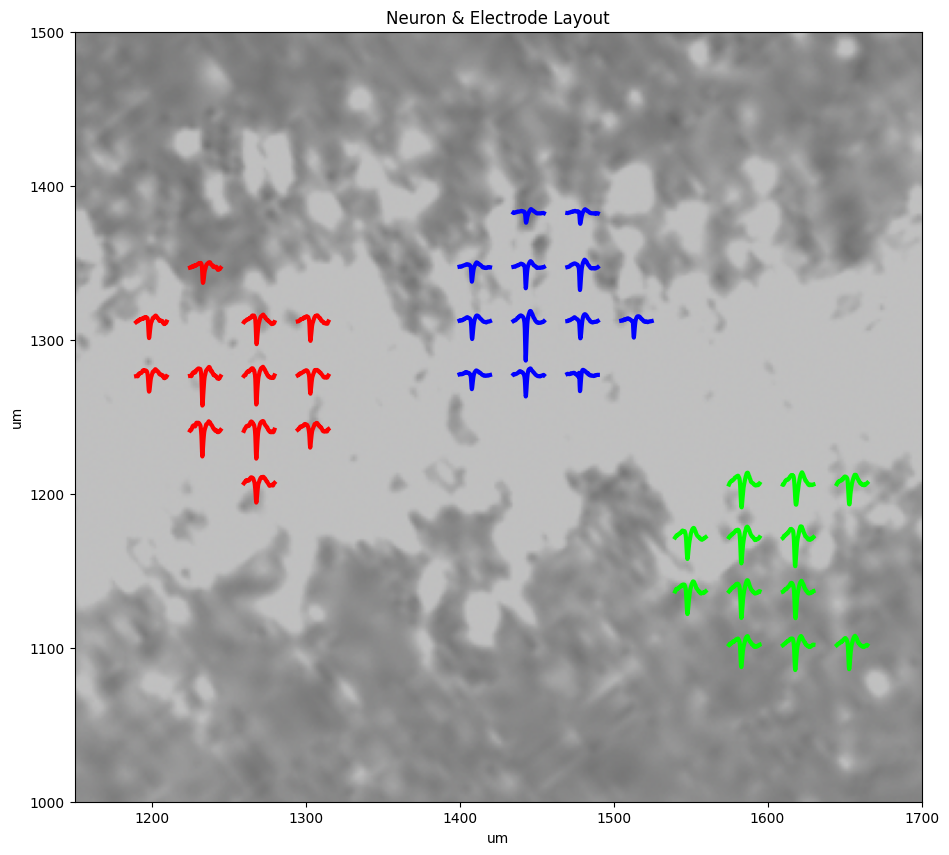

In [52]:
plt.figure(figsize=(15,10)) 
img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823_bw_old.png")      # Load in image
plt.imshow(img,  extent=[0, 3850, 0, 2100]) # Plot image, have it correspond to electrode dimensions

# #for num in [4,16, 3,5,16,29, 33,36,37,38, 44, 47, 58, 93, 94, 98]:
# data = sd.neuron_data[0][109]
# temp_chs=list(data["neighbor_channels"])
# xy =data["neighbor_positions"]
# templates=data["neighbor_templates"]
# for i in range(len(temp_chs)):
#     plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*1.8 +xy[i,1], linewidth=1.8, color="orange"  )
    
data = sd.neuron_data[0][27]
temp_chs=list(data["neighbor_channels"])
xy =data["neighbor_positions"]
templates=data["neighbor_templates"]
for i in range(len(temp_chs)):
    plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*2.5 +xy[i,1], linewidth=3, color="blue"  )


data = sd.neuron_data[0][121]
temp_chs=list(data["neighbor_channels"])
xy =data["neighbor_positions"]
templates=data["neighbor_templates"]
for i in range(len(temp_chs)):
    plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*5 +xy[i,1], linewidth=3, color="lime"  )


data = sd.neuron_data[0][118]
temp_chs=list(data["neighbor_channels"])
xy =data["neighbor_positions"]
templates=data["neighbor_templates"]
for i in range(len(temp_chs)):
    plt.plot(  np.arange(100)/5 +xy[i,0] , templates[i,:]*3 +xy[i,1], linewidth=3, color="red"  )


plt.xlim( 1150, 1700 )                                       # Set axis limits to that of the MEA
plt.ylim( 1000, 1500 )
plt.xlabel('um')                                         # add axises and title
plt.ylabel('um')
plt.title(f"Neuron & Electrode Layout") 